In [15]:
!nvidia-smi

Sun Jan 18 08:16:12 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/path/to/data.zip /content

In [1]:
# Unzip images to a custom data folder
!unzip -q /content/data.zip -d /content/custom_data

In [2]:
!wget -O /content/train_val_split.py https://raw.githubusercontent.com/gameroaster/raw_files/refs/heads/main/train_test_split.py


!python train_val_split.py --datapath="/content/custom_data" --train_pct=0.9

--2026-01-18 08:19:42--  https://raw.githubusercontent.com/gameroaster/raw_files/refs/heads/main/train_test_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3203 (3.1K) [text/plain]
Saving to: ‘/content/train_val_split.py’

/content/train_val_ 100%[===================>]   3.13K  --.-KB/s    in 0s      

2026-01-18 08:19:42 (48.3 MB/s) - ‘/content/train_val_split.py’ saved [3203/3203]

Created folder at /content/data/train/images.
Created folder at /content/data/train/labels.
Created folder at /content/data/validation/images.
Created folder at /content/data/validation/labels.
Number of image files: 219
Number of annotation files: 219
Images moving to train: 197
Images moving to validation: 22


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 31.7 MB/s eta 0:00:00


In [4]:
import yaml
import os

def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  data = {
      'path': '/content/data',
      'train': 'train/images',
      'val': 'validation/images',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = '/content/custom_data/classes.txt'
path_to_data_yaml = '/content/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

print('\nFile contents:\n')
!cat /content/data.yaml

Created config file at /content/data.yaml

File contents:

path: /content/data
train: train/images
val: validation/images
nc: 8
names:
- Hole
- Mouse bite
- Open circuit
- Short
- Spur
- Spurious
- Normal
- Faulty


In [5]:
!yolo detect train data=/content/data.yaml model=yolov8s.pt epochs=60 imgsz=640

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=Fa

In [6]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/validation/images save=True

Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 73 layers, 11,128,680 parameters, 0 gradients, 28.5 GFLOPs

image 1/22 /content/data/validation/images/1d4b6a71-05_spurious_copper_07_jpg.rf.5d300ad93eb1866a2d92a48be6e76249.jpg: 544x640 4 Spuriouss, 42.3ms
image 2/22 /content/data/validation/images/2acdb307-04_open_circuit_01_jpg.rf.acb870e340946dfad002ee711ea9a0e7.jpg: 544x640 1 Open circuit, 15.8ms
image 3/22 /content/data/validation/images/2c4d2180-04_short_05_jpg.rf.ea5b107133fd157d45b8f99d46256a5f.jpg: 544x640 (no detections), 15.7ms
image 4/22 /content/data/validation/images/3d9ab86b-05_open_circuit_03_jpg.rf.a796bf98875d7c0f5d7c25356edaffd4.jpg: 544x640 1 Open circuit, 1 Short, 15.7ms
image 5/22 /content/data/validation/images/41e8b0de-05_spurious_copper_09_jpg.rf.16f7b509ab2b192389563c8937398cee.jpg: 544x640 3 Spuriouss, 15.7ms
image 6/22 /content/data/validation/images/4978eefe-01_missing_hole_07_jpg.rf.a20e7d1d389df2c59951

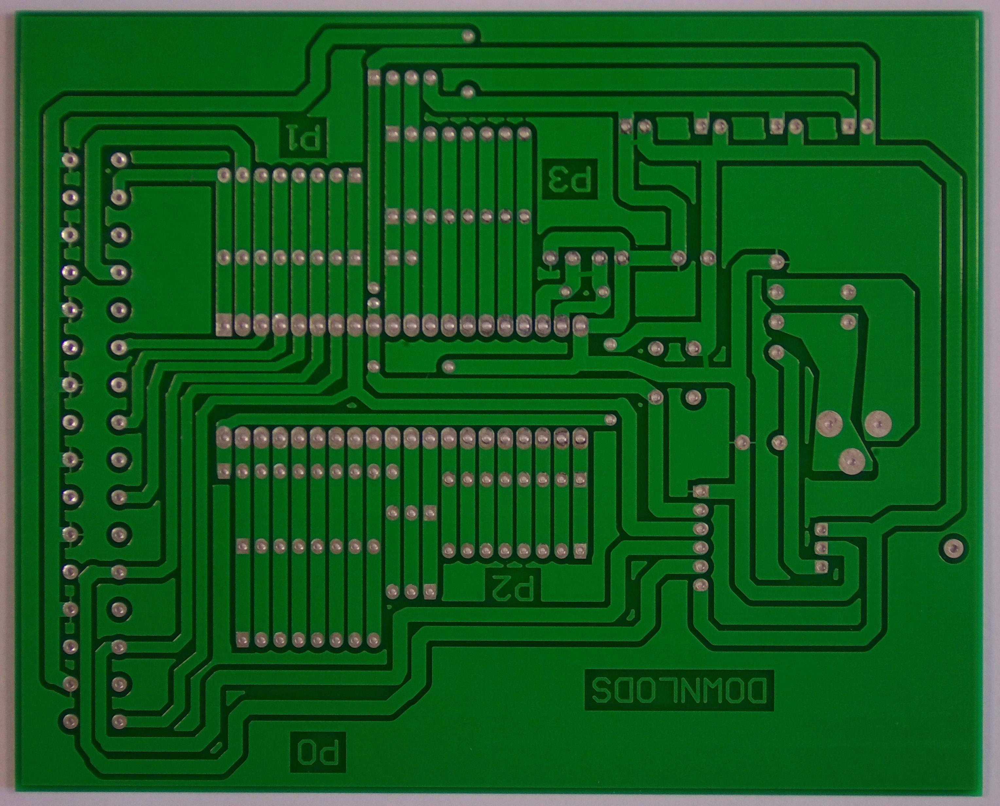

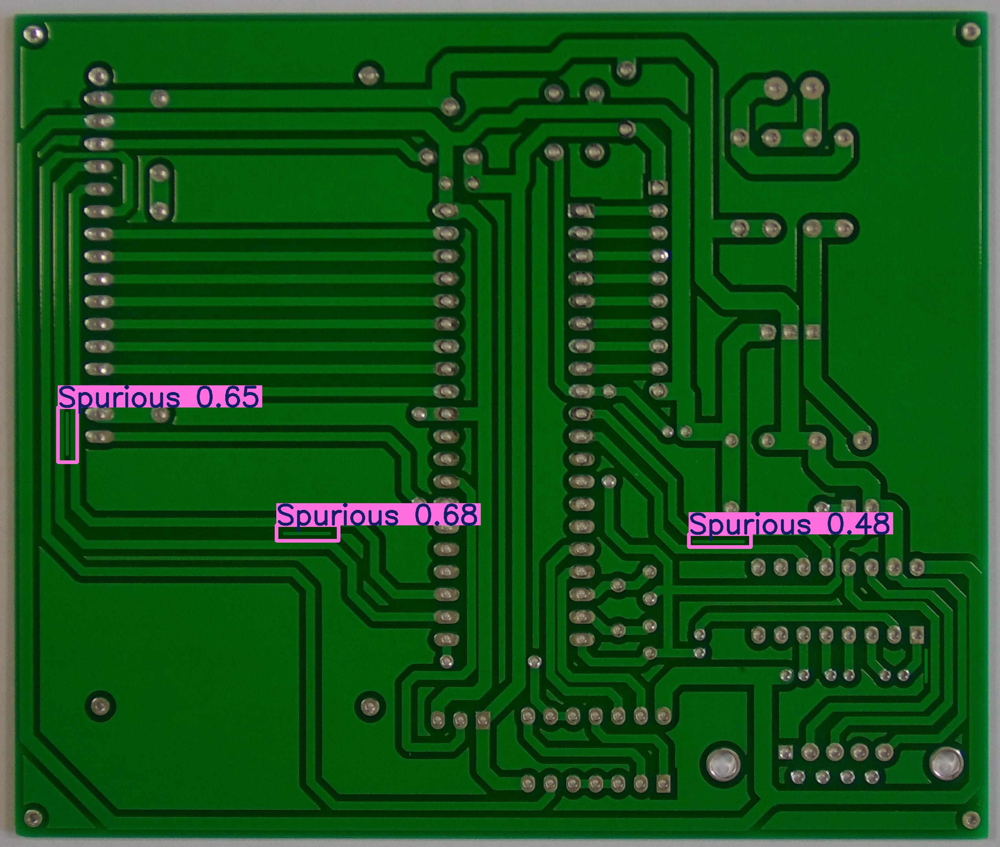

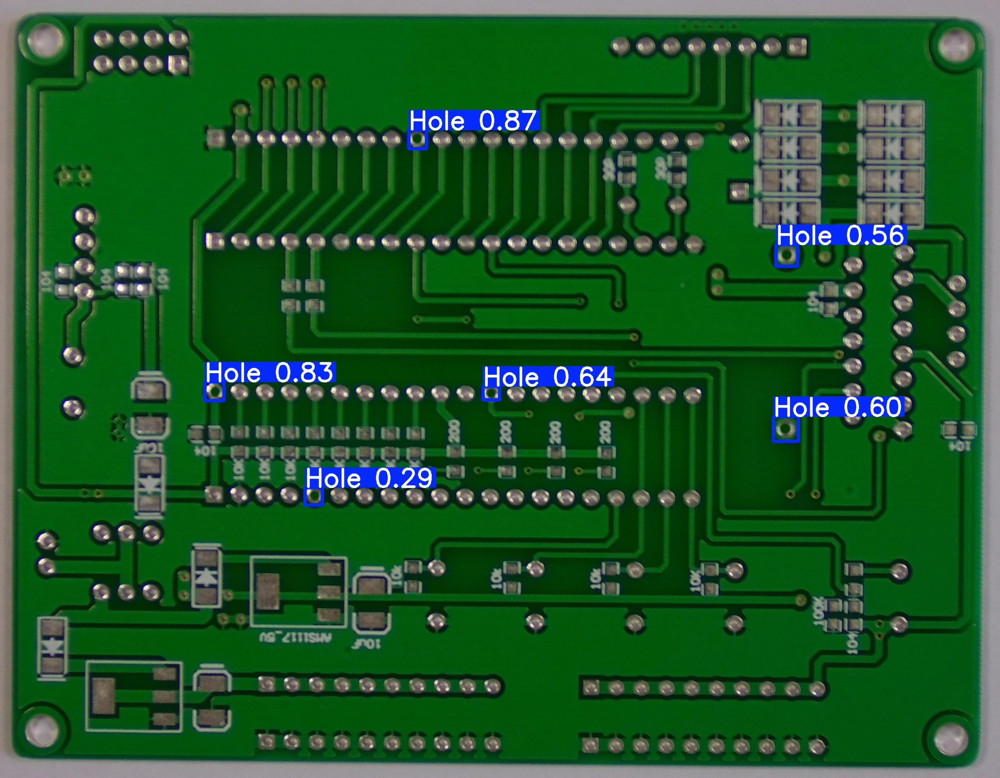

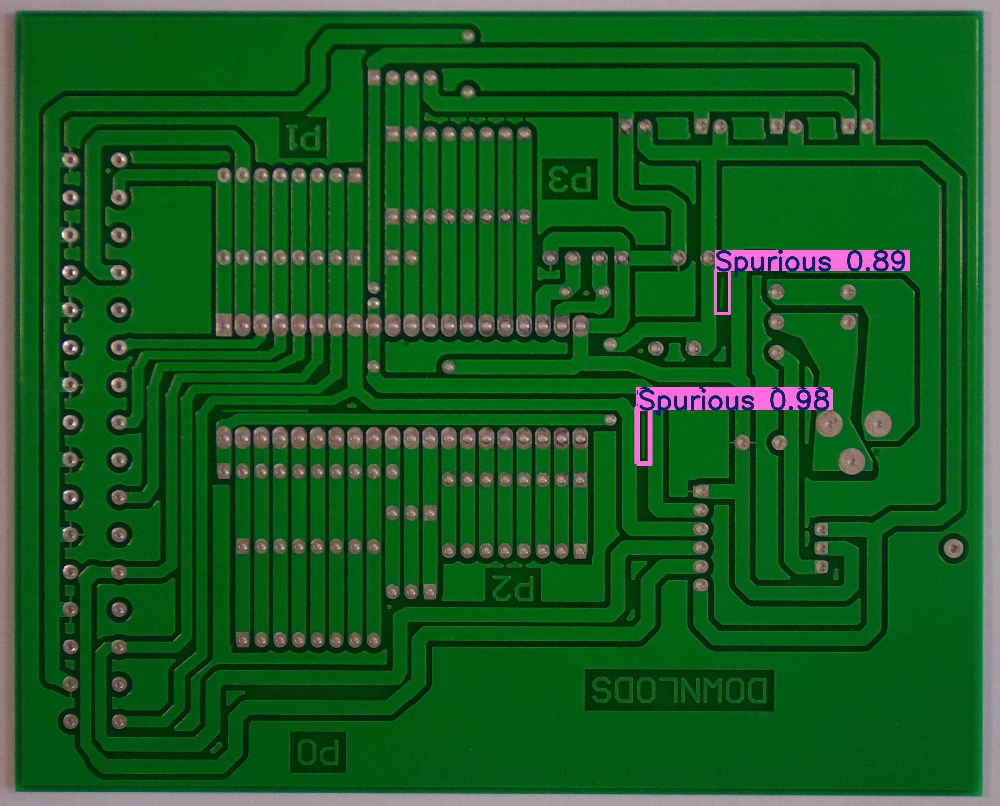

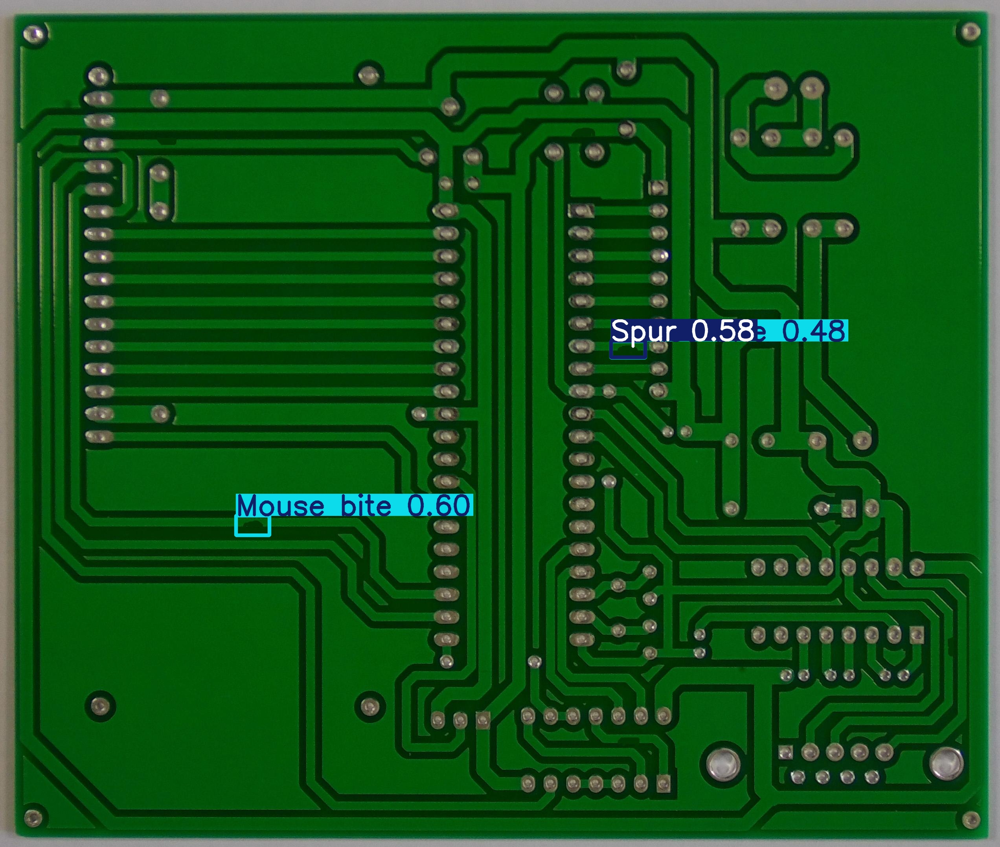

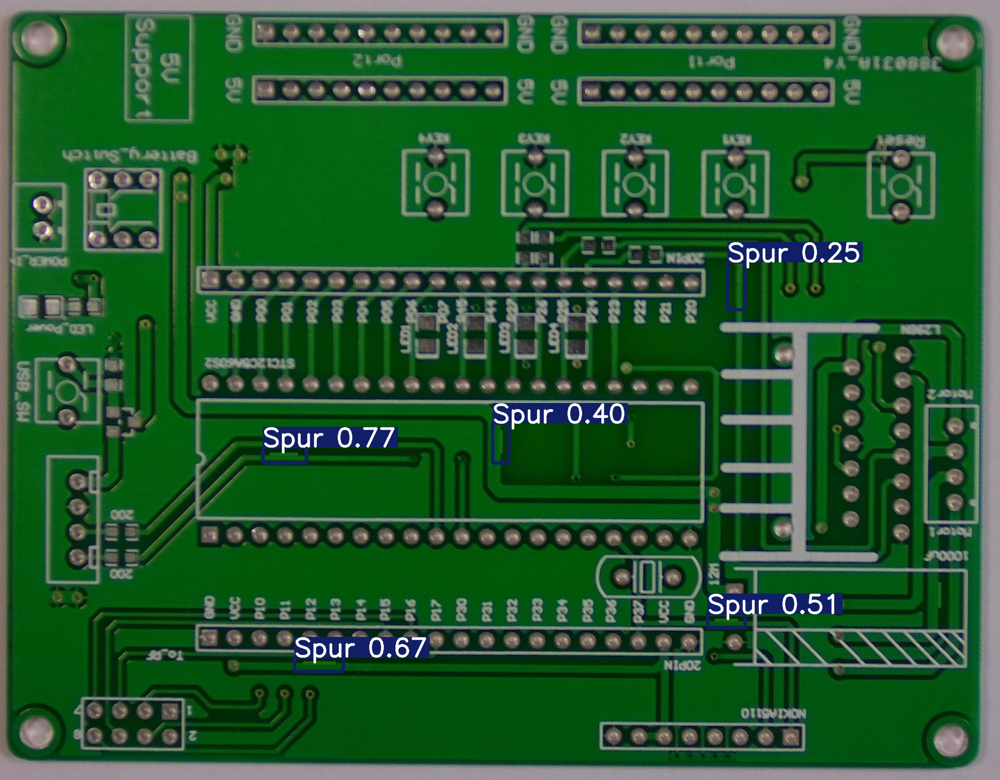

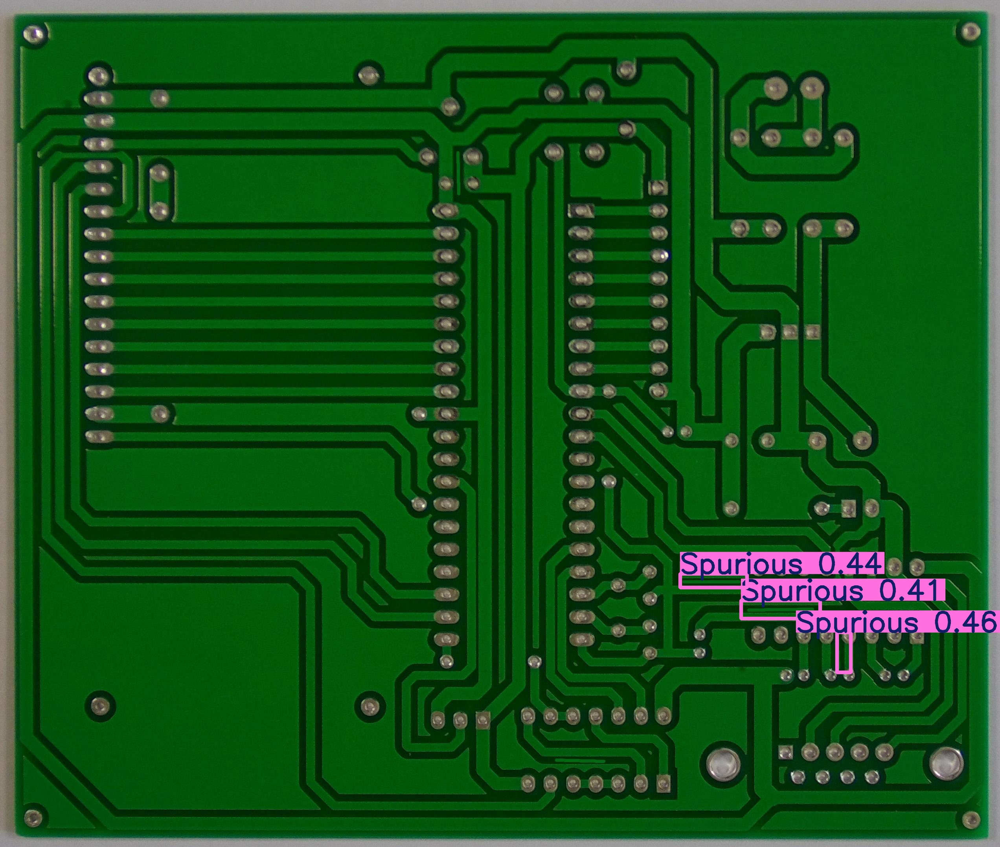

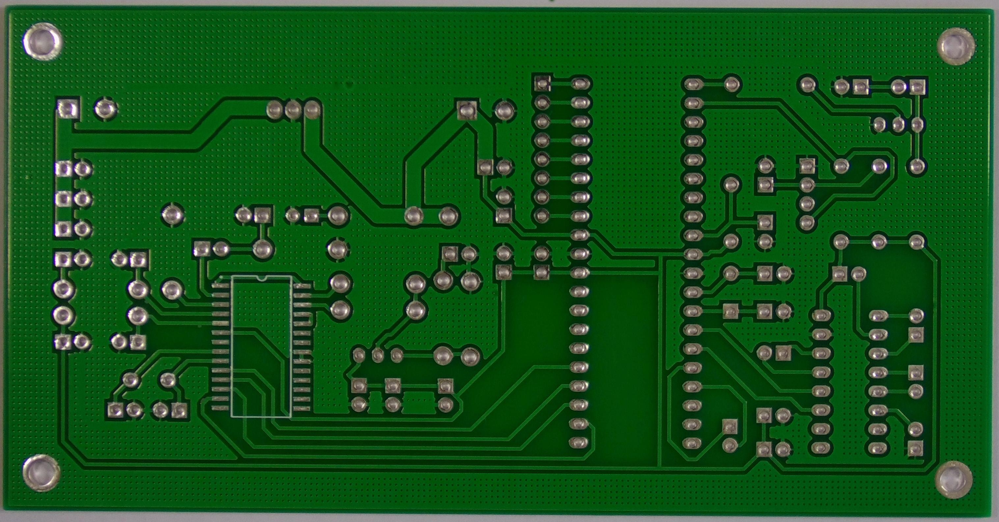

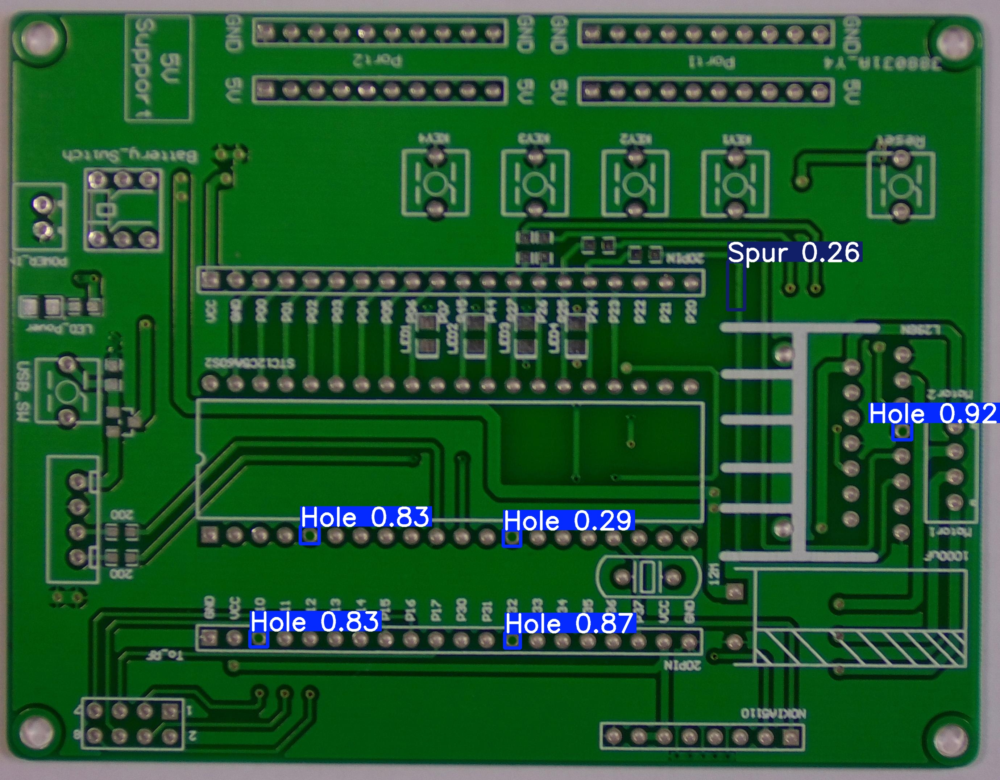

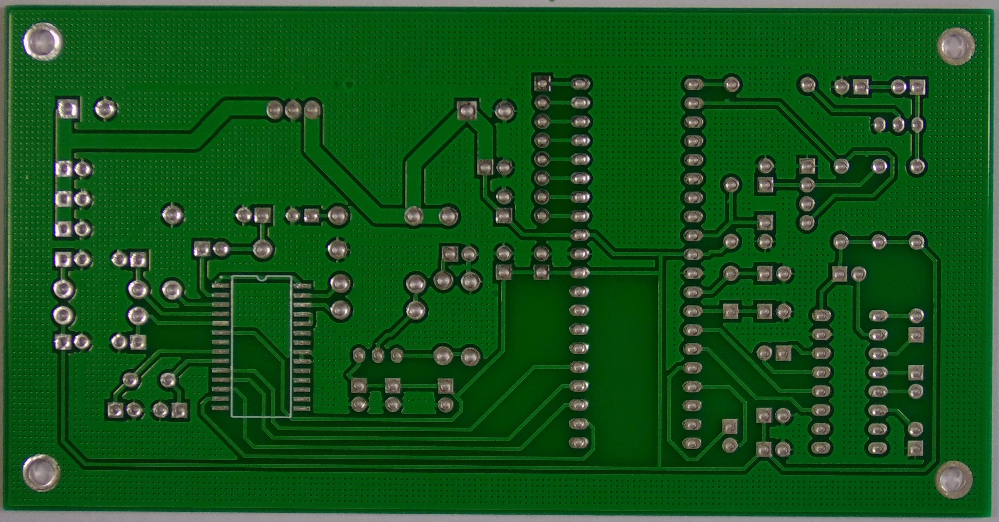

In [7]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]:
  display(Image(filename=image_path, height=400))
  print('\n')


In [8]:
# Create "my_model" folder to store model weights and train results
!mkdir /content/my_model
!cp /content/runs/detect/train/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/detect/train /content/my_model

# Zip into "my_model.zip"
%cd my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train
%cd /content

/content/my_model
  adding: my_model.pt (deflated 8%)
  adding: train/ (stored 0%)
  adding: train/train_batch651.jpg (deflated 8%)
  adding: train/BoxPR_curve.png (deflated 12%)
  adding: train/val_batch0_pred.jpg (deflated 8%)
  adding: train/labels.jpg (deflated 38%)
  adding: train/train_batch652.jpg (deflated 12%)
  adding: train/confusion_matrix.png (deflated 25%)
  adding: train/train_batch0.jpg (deflated 4%)
  adding: train/train_batch650.jpg (deflated 10%)
  adding: train/weights/ (stored 0%)
  adding: train/weights/best.pt (deflated 8%)
  adding: train/weights/last.pt (deflated 8%)
  adding: train/results.png (deflated 7%)
  adding: train/val_batch0_labels.jpg (deflated 8%)
  adding: train/train_batch1.jpg (deflated 5%)
  adding: train/train_batch2.jpg (deflated 3%)
  adding: train/args.yaml (deflated 53%)
  adding: train/results.csv (deflated 69%)
  adding: train/BoxR_curve.png (deflated 9%)
  adding: train/confusion_matrix_normalized.png (deflated 21%)
  adding: train/BoxF1

In [9]:
from ultralytics import YOLO


In [10]:
model = YOLO("/content/yolov8s.pt")
model.export(format="tflite")

Ultralytics 8.4.5 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs

PyTorch: starting from '/content/yolov8s.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (21.5 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'ai-edge-litert>=1.2.0', 'onnx>=1.12.0,<2.0.0', 'onnx2tf>=1.26.3', 'onnxslim>=0.1.71', 'onnxruntime'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 20 packages in 2.18s
Prepared 11 packages in 1.53s
Installed 11 packages in 251ms
 + ai-edge-litert==2.1.0
 + backports-strenum==1.3.1
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.20.1
 + onnx-graphsurgeon==0.5.8
 + onnx2tf==1.28.8
 + onnxruntime==1.23.

/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/utils.py:1447: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: slimming with onnxslim 0.1.82...
ONNX: export success ✅ 2.3s, saved as '/content/yolov8s.onnx' (42.9 MB)
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100% ━━━━━━━━━━━━ 1/1 40.6files/s 0.0s
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.28.8...
Saved artifact at '/content/yolov8s_saved_model'. The following endpoints are available:

* Endpoint 'serving_default'
  inputs_0 (POSITIONAL_ONLY): TensorSpec(shape=(1, 640, 640, 3), dtype=tf.float32, name='images')
Output Type:
  TensorSpec(shape=(1, 84, 8400), dtype=tf.float32, name=None)
Captures:
  139335509056144: TensorSpec(shape=(4, 2), dtype=tf.int32, name=None)
  139335509054608: TensorSpec(shape=(3, 3, 3, 32), dtype=tf.float32, name=None)
  139335509055376: TensorSpec(shape=(32,), dtype=tf.float32, name=None)
  139335509059024: TensorSpec(shape=(4, 2), dtype=tf.int32, name=None)
  139335509060560: TensorSpec(shape=(3, 3, 3

'/content/yolov8s_saved_model/yolov8s_float32.tflite'